# 提取Training_set的AAC特征

In [50]:
##提取训练集的AAC特征
from Bio import SeqIO
from Bio.SeqUtils.ProtParam import ProteinAnalysis

# 自定义AAC特征计算函数
def calculate_aac(sequence):
    protein = ProteinAnalysis(sequence)
    aac = protein.get_amino_acids_percent()
    return list(aac.values())

# 打开输入文件和输出文件
input_file = "Training_set.txt"
output_file = "Training_set_AAC_features.txt"
with open(input_file, "r") as f, open(output_file, "w") as out:
    # 遍历输入文件中的所有蛋白质序列
    for record in SeqIO.parse(f, "fasta"):
        # 跳过空序列
        if len(record.seq) == 0:
            print("Warning: empty sequence found:", record.id)
            continue
        # 计算蛋白质序列的AAC特征
        aac_features = calculate_aac(str(record.seq))
        # 将AAC特征写入输出文件
        out.write(record.id + "\t" + "\t".join(str(x) for x in aac_features) + "\n")

# 提取Test_set的AAC特征

In [51]:
##提取非抗菌肽（nAMP）的AAC特征
from Bio import SeqIO
from Bio.SeqUtils.ProtParam import ProteinAnalysis

# 自定义AAC特征计算函数
def calculate_aac(sequence):
    protein = ProteinAnalysis(sequence)
    aac = protein.get_amino_acids_percent()
    return list(aac.values())

# 打开输入文件和输出文件
input_file = "Test_set.txt"
output_file = "Test_set_AAC_features.txt"
with open(input_file, "r") as f, open(output_file, "w") as out:
    # 遍历输入文件中的所有蛋白质序列
    for record in SeqIO.parse(f, "fasta"):
        # 跳过空序列
        if len(record.seq) == 0:
            print("Warning: empty sequence found:", record.id)
            continue
        # 计算蛋白质序列的AAC特征
        aac_features = calculate_aac(str(record.seq))
        # 将AAC特征写入输出文件
        out.write(record.id + "\t" + "\t".join(str(x) for x in aac_features) + "\n")

# 提取Training_set的PseAAC特征

In [52]:
from Bio import SeqIO
import numpy as np
from collections import defaultdict
import time

# 自定义PseAAC特征计算函数
def calculate_pseaac(sequence, lambda_value=1, w=0.05):
    protein = sequence.upper()
    aa_list = 'ACDEFGHIKLMNPQRSTVWY*X'
    aa_dict = defaultdict(int)
    for aa in protein:
        if aa in aa_list:
            aa_dict[aa] += 1
    aa_freq = np.array([float(aa_dict[aa])/len(protein) for aa in aa_list])
    lamada = lambda_value
    pseaac = []
    for n in range(1, lamada+1):
        temp = []
        for i in range(len(protein)-n):
            temp.append(protein[i:i+n+1])
        dipeptide_dict = defaultdict(int)
        for dipeptide in temp:
            if dipeptide in dipeptide_dict:
                dipeptide_dict[dipeptide] += 1
        for aa1 in aa_list:
            for aa2 in aa_list:
                dipeptide = aa1+aa2
                pseaac.append(float(dipeptide_dict[dipeptide] + w)/(aa_dict[aa1]*aa_dict[aa2] + w**2))
    pseaac = np.array(pseaac)
    return pseaac

# 批量提取蛋白质PseAAC特征并将结果写入输出文件
def extract_pseaac_features(input_file, output_file):
    start_time = time.time()
    with open(input_file, "r") as f, open(output_file, "w") as out:
        for record in SeqIO.parse(f, "fasta"):
            sequence = str(record.seq)
            pseaac_features = calculate_pseaac(sequence)
            pseaac_features = pseaac_features[:20]  # 取前20维特征
            out.write(record.id + "\t" + "\t".join(str(x) for x in pseaac_features) + "\n")
    end_time = time.time()
    print(f"Batch extraction completed in {end_time-start_time:.2f} seconds.")

# 执行批量提取蛋白质PseAAC特征的函数
input_file = "Training_set.txt"
output_file = "Training_set_PseAAC_features.txt"
extract_pseaac_features(input_file, output_file)

Batch extraction completed in 2.24 seconds.


# 提取Test_set的PseAAC特征

In [53]:
from Bio import SeqIO
import numpy as np
from collections import defaultdict
import time

# 自定义PseAAC特征计算函数
def calculate_pseaac(sequence, lambda_value=1, w=0.05):
    protein = sequence.upper()
    aa_list = 'ACDEFGHIKLMNPQRSTVWY*X'
    aa_dict = defaultdict(int)
    for aa in protein:
        if aa in aa_list:
            aa_dict[aa] += 1
    aa_freq = np.array([float(aa_dict[aa])/len(protein) for aa in aa_list])
    lamada = lambda_value
    pseaac = []
    for n in range(1, lamada+1):
        temp = []
        for i in range(len(protein)-n):
            temp.append(protein[i:i+n+1])
        dipeptide_dict = defaultdict(int)
        for dipeptide in temp:
            if dipeptide in dipeptide_dict:
                dipeptide_dict[dipeptide] += 1
        for aa1 in aa_list:
            for aa2 in aa_list:
                dipeptide = aa1+aa2
                pseaac.append(float(dipeptide_dict[dipeptide] + w)/(aa_dict[aa1]*aa_dict[aa2] + w**2))
    pseaac = np.array(pseaac)
    return pseaac

# 批量提取蛋白质PseAAC特征并将结果写入输出文件
def extract_pseaac_features(input_file, output_file):
    start_time = time.time()
    with open(input_file, "r") as f, open(output_file, "w") as out:
        for record in SeqIO.parse(f, "fasta"):
            sequence = str(record.seq)
            pseaac_features = calculate_pseaac(sequence)
            pseaac_features = pseaac_features[:20]  # 取前20维特征
            out.write(record.id + "\t" + "\t".join(str(x) for x in pseaac_features) + "\n")
    end_time = time.time()
    print(f"Batch extraction completed in {end_time-start_time:.2f} seconds.")

# 执行批量提取蛋白质PseAAC特征的函数
input_file = "Test_set.txt"
output_file = "Test_set_PseAAC_features.txt"
extract_pseaac_features(input_file, output_file)

Batch extraction completed in 0.38 seconds.


# RF算法

### RF算法Training_set的AAC特征ROC曲线

Counter({1: 1200, 0: 1200})
accuracy: 97.17%
recall: 97.67%
prec: 96.70%
f1: 97.18%
Counter({0: 1200, 1: 1200})
accuracy: 95.67%
recall: 96.33%
prec: 95.07%
f1: 95.70%
Counter({0: 1200, 1: 1200})
accuracy: 94.83%
recall: 97.33%
prec: 92.70%
f1: 94.96%
Counter({0: 1200, 1: 1200})
accuracy: 95.00%
recall: 96.67%
prec: 93.55%
f1: 95.08%
Counter({0: 1200, 1: 1200})
accuracy: 94.99%
recall: 96.99%
prec: 93.25%
f1: 95.08%


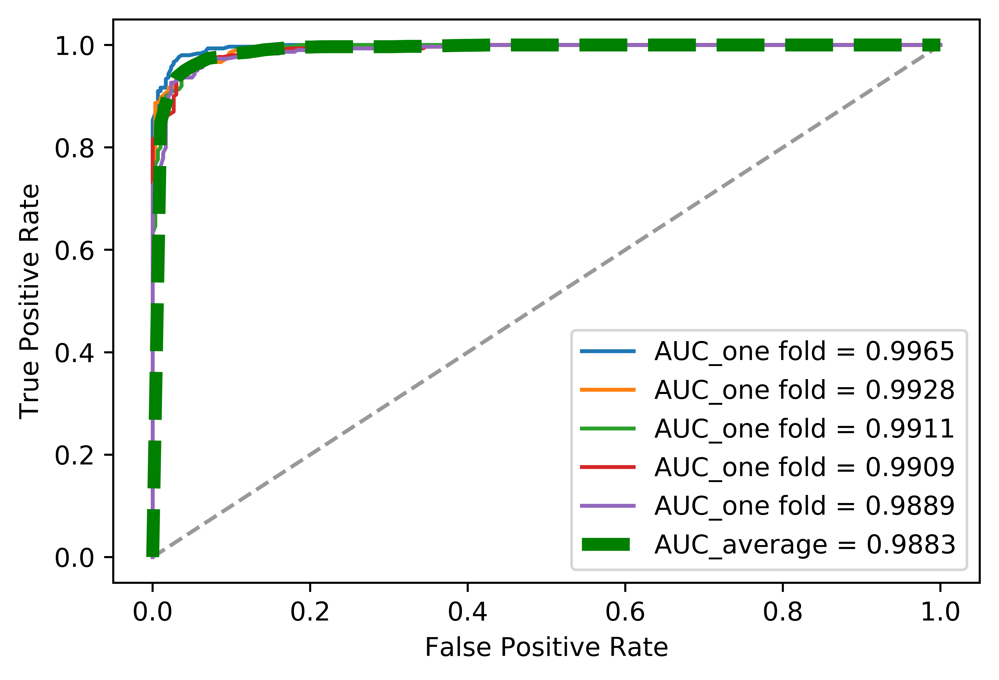

In [13]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.ensemble import RandomForestClassifier
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Training_set_AAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:int(1 * len(data)), :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y



if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)


# 画平均ROC曲线的两个参数
model = RandomForestClassifier(n_estimators=100, random_state=42)

smo = SMOTE(random_state=42)
cv = StratifiedKFold(n_splits=5)  # 导入该模型，后面将数据划分5份

mean_tpr = 0.0  # 用来记录画平均ROC曲线的信息
mean_fpr = np.linspace(0, 1, 100)
cnt = 0
for i, (train, test) in enumerate(cv.split(x, y)):  # 利用模型划分数据集和目标变量 为一一对应的下标
    cnt += 1

    x_train, y_train = smo.fit_resample(x[train], y[train])
    print(Counter(y_train))
    probas_ = model.fit(x_train, y_train).predict_proba(x[test])  # 训练模型后预测每条样本得到两种结果的概率
    #print(probas_)
    y_pred = model.predict(x[test])
    #print(y_pred)
    fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个
    mean_tpr += np.interp(mean_fpr, fpr, tpr)  # 插值函数 interp(x坐标,每次x增加距离,y坐标)  累计每次循环的总值后面求平均值
    mean_tpr[0] = 0.0  # 将第一个真正例=0 以0为起点
    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr, label='AUC_one fold = {0:.4f}'.format(roc_auc), lw=1.5)  # 画出当前分割数据的ROC曲线

    accuracy = accuracy_score(y[test], y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y[test], y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y[test], y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y[test], y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, 'g--', label='AUC_average = {0:.4f}'.format(mean_auc), lw=5)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('RF算法Training_set的AAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### RF算法Test_set的AAC特征ROC曲线

accuracy: 90.00%
recall: 86.96%
prec: 90.91%
f1: 88.89%


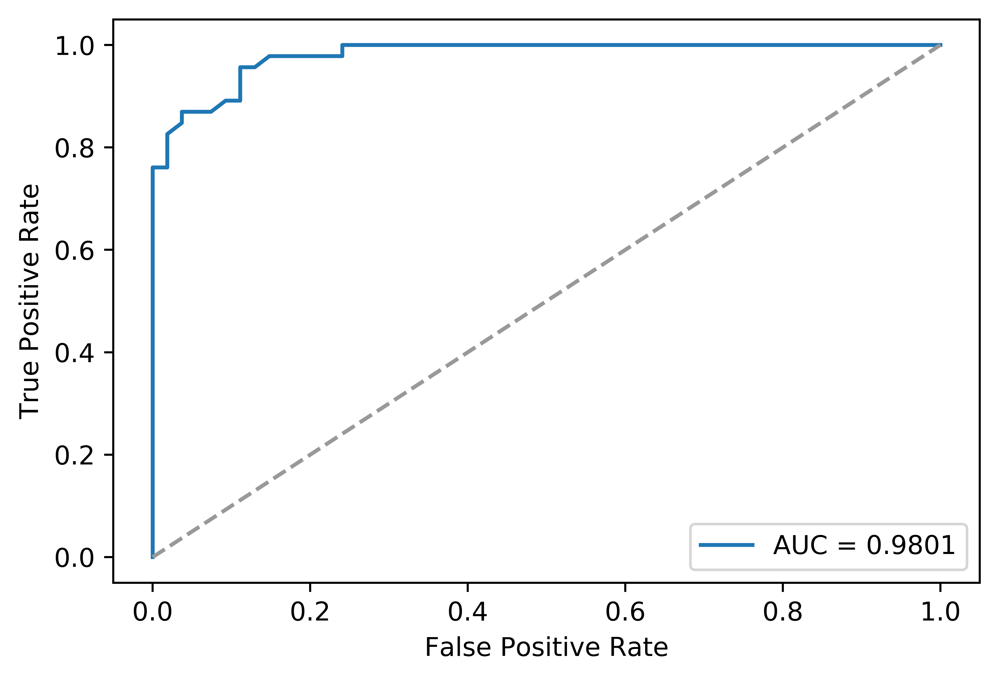

In [4]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.ensemble import RandomForestClassifier
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Test_set_AAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:, :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y

if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

    model = RandomForestClassifier(n_estimators=100, random_state=42)
    smo = SMOTE(random_state=42)
    x_train_res, y_train_res = smo.fit_resample(x_train, y_train)

    probas_ = model.fit(x_train_res, y_train_res).predict_proba(x_test)  # 训练模型后预测每条样本得到两种结果的概率

    y_pred = model.predict(x_test)

    fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个

    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr, label='AUC = {0:.4f}'.format(roc_auc), lw=1.5)  # 画出ROC曲线

    accuracy = accuracy_score(y_test, y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y_test, y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y_test, y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y_test, y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('RF算法Test_set的AAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### RF算法PseAAC特征ROC曲线

Counter({0: 1200, 1: 1200})
accuracy: 91.00%
recall: 98.00%
prec: 85.96%
f1: 91.59%
Counter({0: 1200, 1: 1200})
accuracy: 89.50%
recall: 98.00%
prec: 83.76%
f1: 90.32%
Counter({0: 1200, 1: 1200})
accuracy: 90.33%
recall: 96.33%
prec: 86.01%
f1: 90.88%
Counter({0: 1200, 1: 1200})
accuracy: 92.17%
recall: 96.67%
prec: 88.69%
f1: 92.50%
Counter({0: 1200, 1: 1200})
accuracy: 90.48%
recall: 94.65%
prec: 87.35%
f1: 90.85%


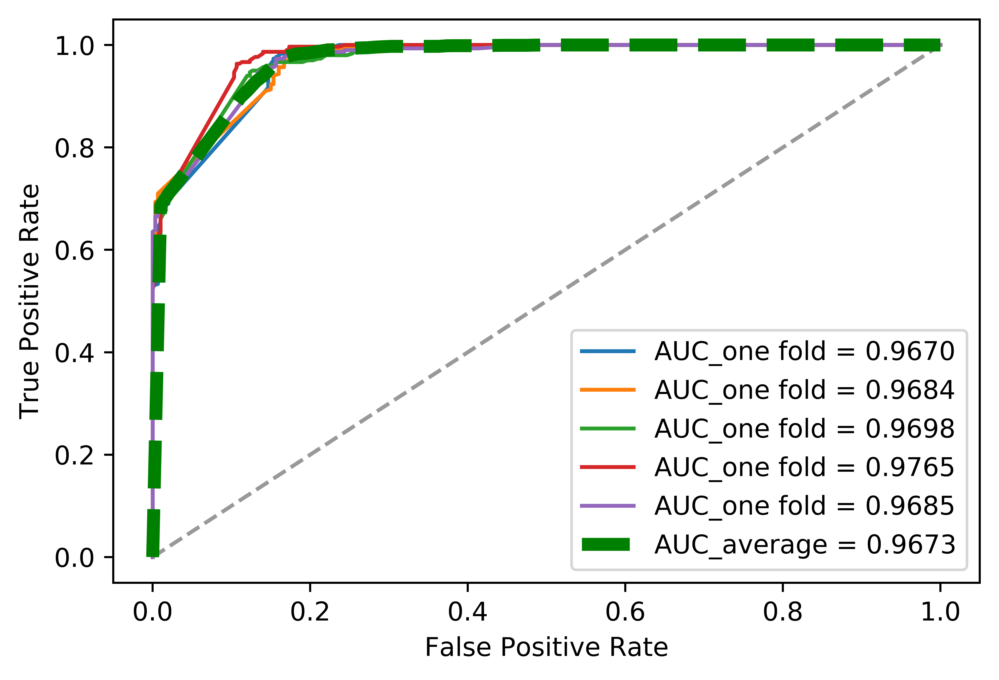

In [14]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.ensemble import RandomForestClassifier
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Training_set_PseAAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:int(1 * len(data)), :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y



if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)


# 画平均ROC曲线的两个参数
model = RandomForestClassifier(n_estimators=100, random_state=42)

smo = SMOTE(random_state=42)
cv = StratifiedKFold(n_splits=5)  # 导入该模型，后面将数据划分5份

mean_tpr = 0.0  # 用来记录画平均ROC曲线的信息
mean_fpr = np.linspace(0, 1, 100)
cnt = 0
for i, (train, test) in enumerate(cv.split(x, y)):  # 利用模型划分数据集和目标变量 为一一对应的下标
    cnt += 1

    x_train, y_train = smo.fit_resample(x[train], y[train])
    print(Counter(y_train))
    probas_ = model.fit(x_train, y_train).predict_proba(x[test])  # 训练模型后预测每条样本得到两种结果的概率
    #print(probas_)
    y_pred = model.predict(x[test])
    #print(y_pred)
    fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个
    mean_tpr += np.interp(mean_fpr, fpr, tpr)  # 插值函数 interp(x坐标,每次x增加距离,y坐标)  累计每次循环的总值后面求平均值
    mean_tpr[0] = 0.0  # 将第一个真正例=0 以0为起点
    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr, label='AUC_one fold = {0:.4f}'.format(roc_auc), lw=1.5)  # 画出当前分割数据的ROC曲线

    accuracy = accuracy_score(y[test], y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y[test], y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y[test], y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y[test], y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, 'g--', label='AUC_average = {0:.4f}'.format(mean_auc), lw=5)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('RF算法Training_set的PseAAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### RF算法Test_set的PseAAC特征ROC曲线

accuracy: 87.00%
recall: 92.98%
prec: 85.48%
f1: 89.08%


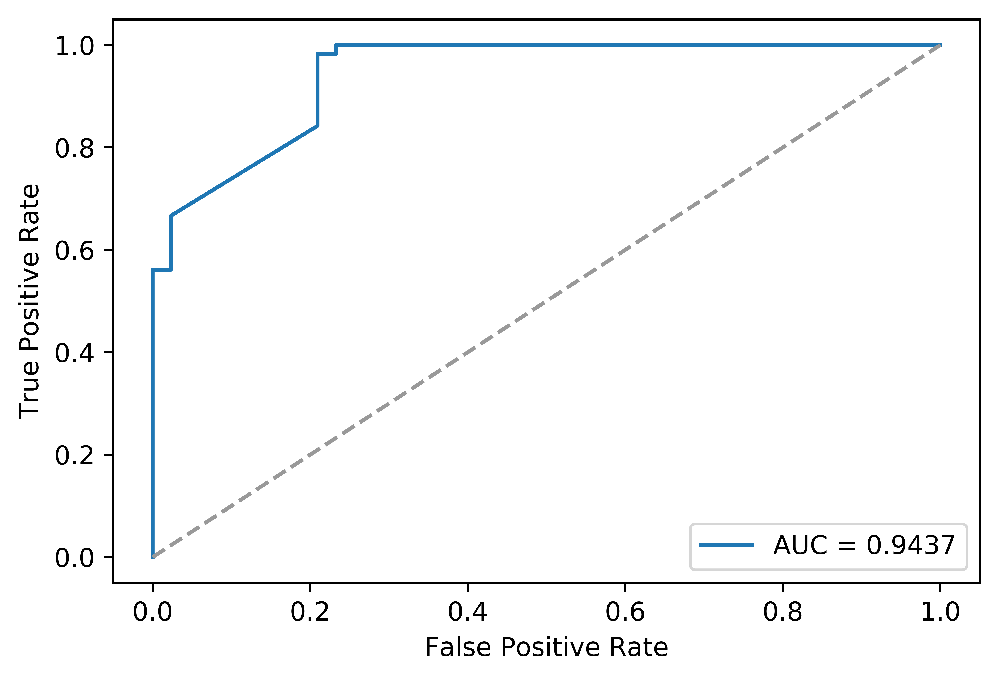

In [9]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.ensemble import RandomForestClassifier
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Test_set_PseAAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:, :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y

if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

    model = RandomForestClassifier(n_estimators=100, random_state=42)
    smo = SMOTE(random_state=42)
    x_train_res, y_train_res = smo.fit_resample(x_train, y_train)

    probas_ = model.fit(x_train_res, y_train_res).predict_proba(x_test)  # 训练模型后预测每条样本得到两种结果的概率

    y_pred = model.predict(x_test)

    fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个

    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr, label='AUC = {0:.4f}'.format(roc_auc), lw=1.5)  # 画出ROC曲线

    accuracy = accuracy_score(y_test, y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y_test, y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y_test, y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y_test, y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('RF算法Test_set的PseAAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

# SVM算法

### SVM算法Training_set的AAC特征ROC曲线

Counter({1: 1200, 0: 1200})
accuracy: 92.67%
recall: 95.67%
prec: 90.25%
f1: 92.88%
Counter({1: 1200, 0: 1200})
accuracy: 94.83%
recall: 98.67%
prec: 91.64%
f1: 95.02%
Counter({1: 1200, 0: 1200})
accuracy: 95.00%
recall: 98.33%
prec: 92.19%
f1: 95.16%
Counter({1: 1200, 0: 1200})
accuracy: 93.33%
recall: 97.33%
prec: 90.12%
f1: 93.59%
Counter({1: 1200, 0: 1200})
accuracy: 94.16%
recall: 98.33%
prec: 90.74%
f1: 94.38%


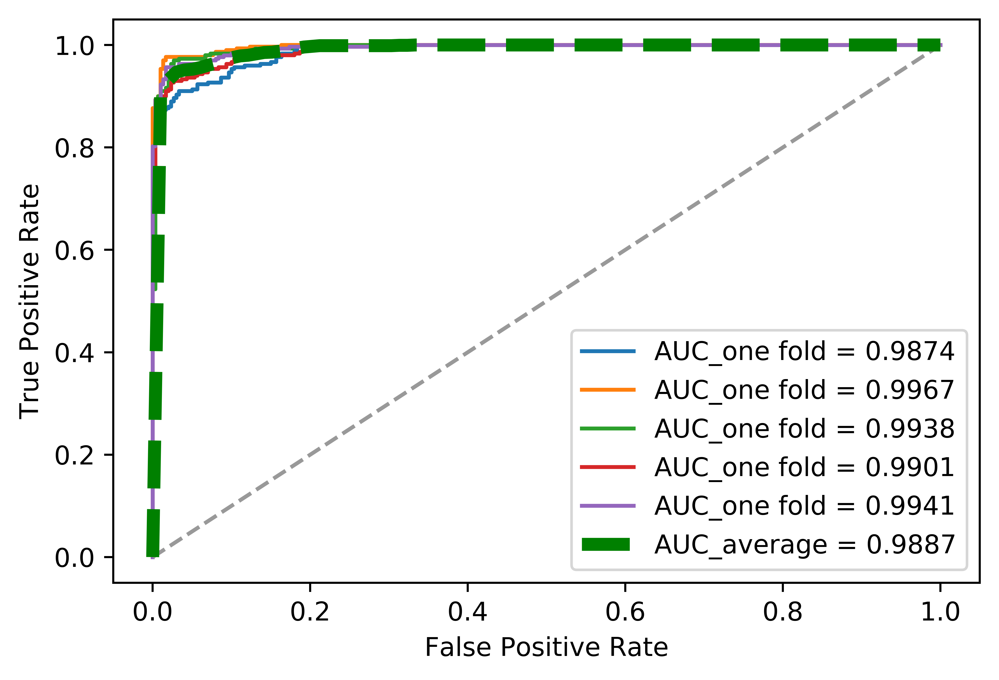

In [42]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.svm import SVC
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Training_set_AAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:int(1 * len(data)), :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y



if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)


# 画平均ROC曲线的两个参数
model = SVC(kernel='rbf', C=1, gamma='auto', probability=True, random_state=42)

smo = SMOTE(random_state=42)
cv = StratifiedKFold(n_splits=5)  # 导入该模型，后面将数据划分5份

mean_tpr = 0.0  # 用来记录画平均ROC曲线的信息
mean_fpr = np.linspace(0, 1, 100)
cnt = 0
for i, (train, test) in enumerate(cv.split(x, y)):  # 利用模型划分数据集和目标变量 为一一对应的下标
    cnt += 1

    x_train, y_train = smo.fit_resample(x[train], y[train])
    print(Counter(y_train))
    probas_ = model.fit(x_train, y_train).predict_proba(x[test])  # 训练模型后预测每条样本得到两种结果的概率
    #print(probas_)
    y_pred = model.predict(x[test])
    #print(y_pred)
    fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个
    mean_tpr += np.interp(mean_fpr, fpr, tpr)  # 插值函数 interp(x坐标,每次x增加距离,y坐标)  累计每次循环的总值后面求平均值
    mean_tpr[0] = 0.0  # 将第一个真正例=0 以0为起点
    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr, label='AUC_one fold = {0:.4f}'.format(roc_auc), lw=1.5)  # 画出当前分割数据的ROC曲线

    accuracy = accuracy_score(y[test], y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y[test], y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y[test], y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y[test], y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, 'g--', label='AUC_average = {0:.4f}'.format(mean_auc), lw=5)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('SVM算法Training_set的AAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### SVM算法Test_set的AAC特征ROC曲线

accuracy: 91.00%
recall: 98.00%
prec: 85.96%
f1: 91.59%


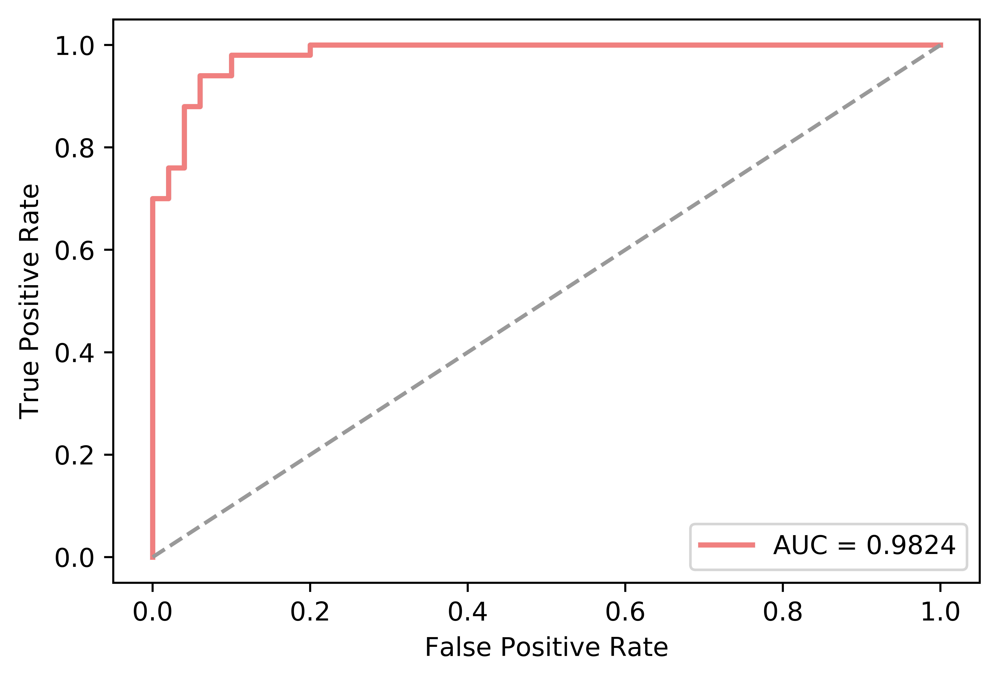

In [44]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.svm import SVC
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Test_set_AAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:, :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y

if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

    model = SVC(kernel='rbf', C=1, gamma='auto', probability=True, random_state=42)
    smo = SMOTE(random_state=42)
    x_train_res, y_train_res = smo.fit_resample(x_train, y_train)

    probas_ = model.fit(x_train_res, y_train_res).predict_proba(x_test)  # 训练模型后预测每条样本得到两种结果的概率

    y_pred = model.predict(x_test)

    fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个

    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr,  color='lightcoral',label='AUC = {0:.4f}'.format(roc_auc), lw=2)  # 画出ROC曲线

    accuracy = accuracy_score(y_test, y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y_test, y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y_test, y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y_test, y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('SVM算法Test_set的AAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### SVM算法Training_set的PseAAC特征ROC曲线

Counter({1: 1200, 0: 1200})
accuracy: 84.33%
recall: 98.33%
prec: 76.82%
f1: 86.26%
Counter({1: 1200, 0: 1200})
accuracy: 81.33%
recall: 97.67%
prec: 73.62%
f1: 83.95%
Counter({1: 1200, 0: 1200})
accuracy: 83.83%
recall: 97.33%
prec: 76.64%
f1: 85.76%
Counter({1: 1200, 0: 1200})
accuracy: 85.33%
recall: 97.33%
prec: 78.49%
f1: 86.90%
Counter({1: 1200, 0: 1200})
accuracy: 82.14%
recall: 96.32%
prec: 75.00%
f1: 84.33%


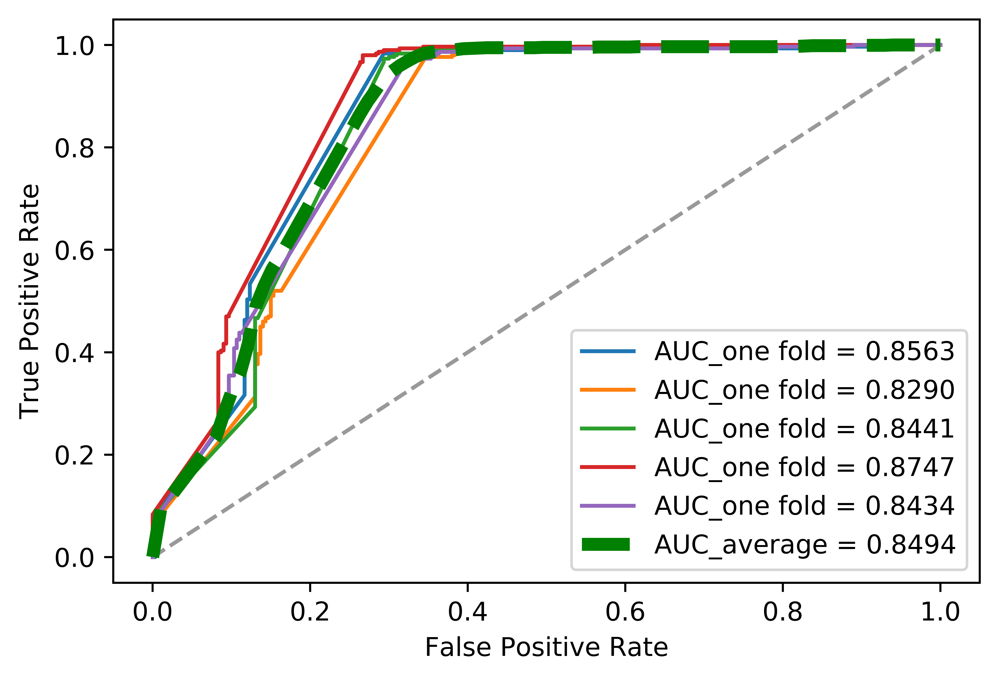

In [11]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.svm import SVC
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Training_set_PseAAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:int(1 * len(data)), :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y



if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)


# 画平均ROC曲线的两个参数
model = SVC(kernel='rbf', C=1, gamma='auto', probability=True, random_state=42)

smo = SMOTE(random_state=42)
cv = StratifiedKFold(n_splits=5)  # 导入该模型，后面将数据划分5份

mean_tpr = 0.0  # 用来记录画平均ROC曲线的信息
mean_fpr = np.linspace(0, 1, 100)
cnt = 0
for i, (train, test) in enumerate(cv.split(x, y)):  # 利用模型划分数据集和目标变量 为一一对应的下标
    cnt += 1

    x_train, y_train = smo.fit_resample(x[train], y[train])
    print(Counter(y_train))
    probas_ = model.fit(x_train, y_train).predict_proba(x[test])  # 训练模型后预测每条样本得到两种结果的概率
    #print(probas_)
    y_pred = model.predict(x[test])
    #print(y_pred)
    fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个
    mean_tpr += np.interp(mean_fpr, fpr, tpr)  # 插值函数 interp(x坐标,每次x增加距离,y坐标)  累计每次循环的总值后面求平均值
    mean_tpr[0] = 0.0  # 将第一个真正例=0 以0为起点
    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr, label='AUC_one fold = {0:.4f}'.format(roc_auc), lw=1.5)  # 画出当前分割数据的ROC曲线

    accuracy = accuracy_score(y[test], y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y[test], y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y[test], y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y[test], y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, 'g--', label='AUC_average = {0:.4f}'.format(mean_auc), lw=5)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('SVM算法Training_set的PseAAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### SVM算法Test_set的PseAAC特征ROC曲线

accuracy: 63.00%
recall: 80.39%
prec: 60.29%
f1: 68.91%


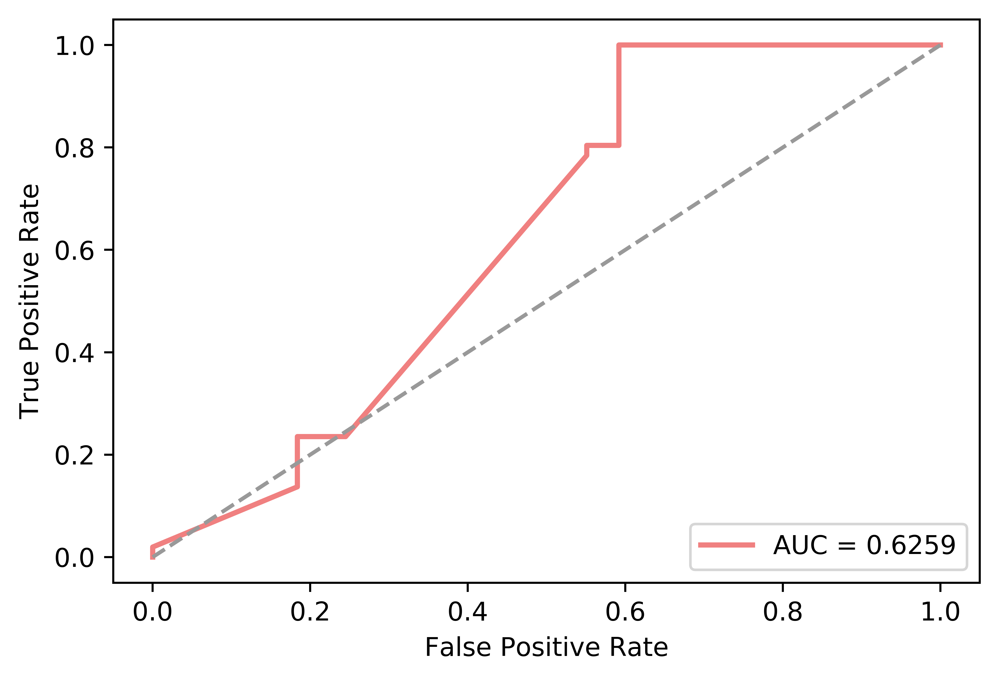

In [49]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.svm import SVC
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Test_set_PseAAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:, :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y

if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

    model = SVC(kernel='rbf', C=1, gamma='auto', probability=True, random_state=42)
    smo = SMOTE(random_state=42)
    x_train_res, y_train_res = smo.fit_resample(x_train, y_train)

    probas_ = model.fit(x_train_res, y_train_res).predict_proba(x_test)  # 训练模型后预测每条样本得到两种结果的概率

    y_pred = model.predict(x_test)

    fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个

    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr,  color='lightcoral',label='AUC = {0:.4f}'.format(roc_auc), lw=2)  # 画出ROC曲线

    accuracy = accuracy_score(y_test, y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y_test, y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y_test, y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y_test, y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('SVM算法Test_set的PseAAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

# 朴素Bayes算法

### Bayes算法Training_set的AAC特征ROC曲线

Counter({0: 1200, 1: 1200})
accuracy: 93.50%
recall: 93.67%
prec: 93.36%
f1: 93.51%
Counter({0: 1200, 1: 1200})
accuracy: 94.33%
recall: 94.33%
prec: 94.33%
f1: 94.33%
Counter({0: 1200, 1: 1200})
accuracy: 92.83%
recall: 93.00%
prec: 92.69%
f1: 92.85%
Counter({0: 1200, 1: 1200})
accuracy: 93.17%
recall: 94.00%
prec: 92.46%
f1: 93.22%
Counter({0: 1200, 1: 1200})
accuracy: 93.66%
recall: 92.64%
prec: 94.54%
f1: 93.58%


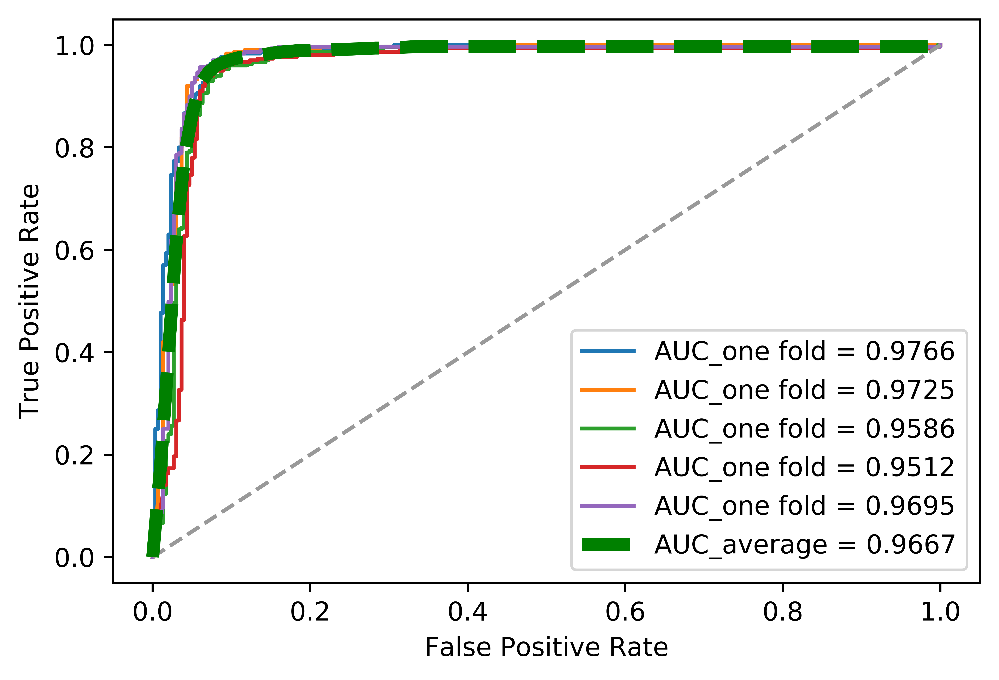

In [16]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.naive_bayes import GaussianNB
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Training_set_AAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:int(1 * len(data)), :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y



if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)


# 画平均ROC曲线的两个参数
model = GaussianNB()

smo = SMOTE(random_state=42)
cv = StratifiedKFold(n_splits=5)  # 导入该模型，后面将数据划分5份

mean_tpr = 0.0  # 用来记录画平均ROC曲线的信息
mean_fpr = np.linspace(0, 1, 100)
cnt = 0
for i, (train, test) in enumerate(cv.split(x, y)):  # 利用模型划分数据集和目标变量 为一一对应的下标
    cnt += 1

    x_train, y_train = smo.fit_resample(x[train], y[train])
    print(Counter(y_train))
    probas_ = model.fit(x_train, y_train).predict_proba(x[test])  # 训练模型后预测每条样本得到两种结果的概率
    #print(probas_)
    y_pred = model.predict(x[test])
    #print(y_pred)
    fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个
    mean_tpr += np.interp(mean_fpr, fpr, tpr)  # 插值函数 interp(x坐标,每次x增加距离,y坐标)  累计每次循环的总值后面求平均值
    mean_tpr[0] = 0.0  # 将第一个真正例=0 以0为起点
    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr, label='AUC_one fold = {0:.4f}'.format(roc_auc), lw=1.5)  # 画出当前分割数据的ROC曲线

    accuracy = accuracy_score(y[test], y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y[test], y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y[test], y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y[test], y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, 'g--', label='AUC_average = {0:.4f}'.format(mean_auc), lw=5)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('Bayes算法Training_set的AAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### Bayes算法Test_set的AAC特征ROC曲线

accuracy: 88.00%
recall: 86.27%
prec: 89.80%
f1: 88.00%


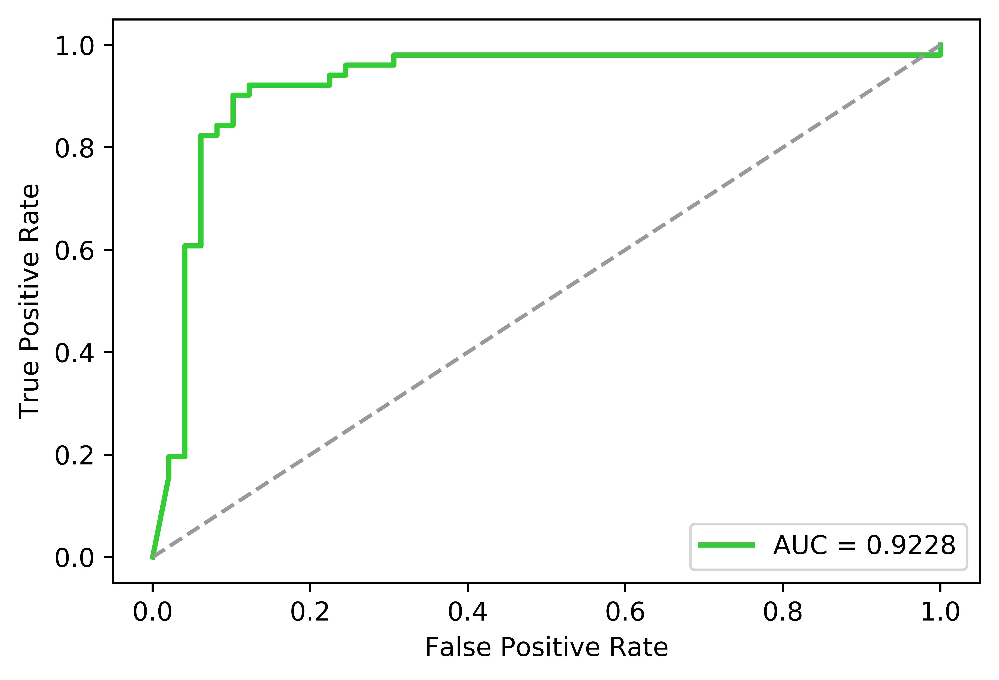

In [46]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.naive_bayes import GaussianNB
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Test_set_AAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:, :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y

if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

    model = GaussianNB()
    smo = SMOTE(random_state=42)
    x_train_res, y_train_res = smo.fit_resample(x_train, y_train)

    probas_ = model.fit(x_train_res, y_train_res).predict_proba(x_test)  # 训练模型后预测每条样本得到两种结果的概率

    y_pred = model.predict(x_test)

    fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个

    roc_auc = auc(fpr, tpr)  # 求auc面积
    
    plt.plot(fpr, tpr,  color='limegreen',label='AUC = {0:.4f}'.format(roc_auc), lw=2)  # 画出ROC曲线

    accuracy = accuracy_score(y_test, y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y_test, y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y_test, y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y_test, y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('Bayes算法Test_set的AAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### Bayes算法Training_set的PseAAC特征ROC曲线

Counter({1: 1200, 0: 1200})
accuracy: 79.33%
recall: 75.67%
prec: 81.65%
f1: 78.55%
Counter({0: 1200, 1: 1200})
accuracy: 82.33%
recall: 81.00%
prec: 83.22%
f1: 82.09%
Counter({0: 1200, 1: 1200})
accuracy: 81.83%
recall: 79.00%
prec: 83.75%
f1: 81.30%
Counter({0: 1200, 1: 1200})
accuracy: 78.50%
recall: 76.67%
prec: 79.58%
f1: 78.10%
Counter({0: 1200, 1: 1200})
accuracy: 81.80%
recall: 80.60%
prec: 82.53%
f1: 81.56%


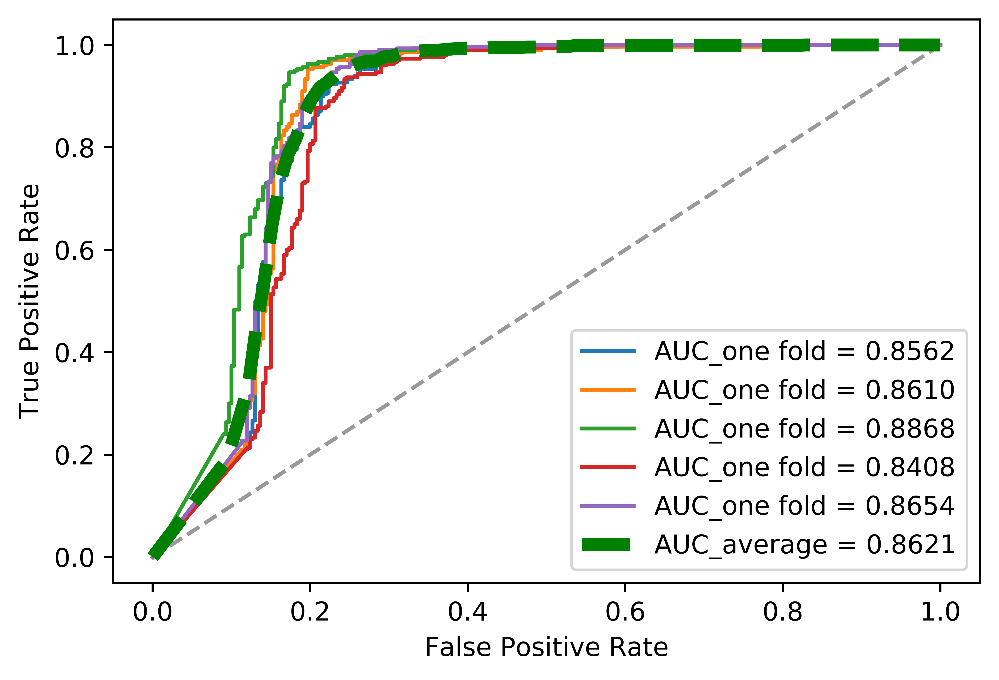

In [18]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.naive_bayes import GaussianNB
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Training_set_PseAAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:int(1 * len(data)), :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y



if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)


# 画平均ROC曲线的两个参数
model = GaussianNB()

smo = SMOTE(random_state=42)
cv = StratifiedKFold(n_splits=5)  # 导入该模型，后面将数据划分5份

mean_tpr = 0.0  # 用来记录画平均ROC曲线的信息
mean_fpr = np.linspace(0, 1, 100)
cnt = 0
for i, (train, test) in enumerate(cv.split(x, y)):  # 利用模型划分数据集和目标变量 为一一对应的下标
    cnt += 1

    x_train, y_train = smo.fit_resample(x[train], y[train])
    print(Counter(y_train))
    probas_ = model.fit(x_train, y_train).predict_proba(x[test])  # 训练模型后预测每条样本得到两种结果的概率
    #print(probas_)
    y_pred = model.predict(x[test])
    #print(y_pred)
    fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个
    mean_tpr += np.interp(mean_fpr, fpr, tpr)  # 插值函数 interp(x坐标,每次x增加距离,y坐标)  累计每次循环的总值后面求平均值
    mean_tpr[0] = 0.0  # 将第一个真正例=0 以0为起点
    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr, label='AUC_one fold = {0:.4f}'.format(roc_auc), lw=1.5)  # 画出当前分割数据的ROC曲线

    accuracy = accuracy_score(y[test], y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y[test], y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y[test], y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y[test], y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, 'g--', label='AUC_average = {0:.4f}'.format(mean_auc), lw=5)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('Bayes算法Training_set的PseAAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### Bayes算法Test_set的PseAAC特征ROC曲线

accuracy: 76.00%
recall: 74.00%
prec: 77.08%
f1: 75.51%


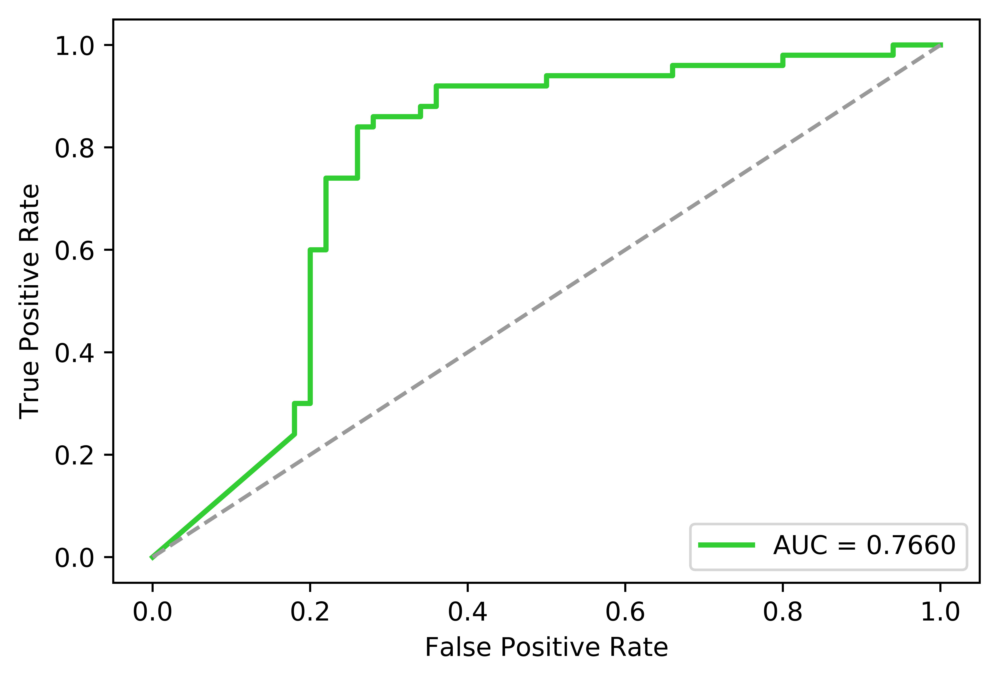

In [54]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.naive_bayes import GaussianNB
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Test_set_PseAAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:, :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y

if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

    model = GaussianNB()
    smo = SMOTE(random_state=42)
    x_train_res, y_train_res = smo.fit_resample(x_train, y_train)

    probas_ = model.fit(x_train_res, y_train_res).predict_proba(x_test)  # 训练模型后预测每条样本得到两种结果的概率

    y_pred = model.predict(x_test)

    fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个

    roc_auc = auc(fpr, tpr)  # 求auc面积
    
    plt.plot(fpr, tpr,  color='limegreen',label='AUC = {0:.4f}'.format(roc_auc), lw=2)  # 画出ROC曲线

    accuracy = accuracy_score(y_test, y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y_test, y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y_test, y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y_test, y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('Bayes算法Test_set的PseAAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

# Knn算法

### Knn算法Training_set的AAC特征ROC曲线

Counter({1: 1200, 0: 1200})
accuracy: 94.00%
recall: 92.00%
prec: 95.83%
f1: 93.88%
Counter({1: 1200, 0: 1200})
accuracy: 93.17%
recall: 91.00%
prec: 95.12%
f1: 93.02%
Counter({1: 1200, 0: 1200})
accuracy: 94.00%
recall: 92.33%
prec: 95.52%
f1: 93.90%
Counter({1: 1200, 0: 1200})
accuracy: 96.17%
recall: 95.00%
prec: 97.27%
f1: 96.12%
Counter({1: 1200, 0: 1200})
accuracy: 93.99%
recall: 93.31%
prec: 94.58%
f1: 93.94%


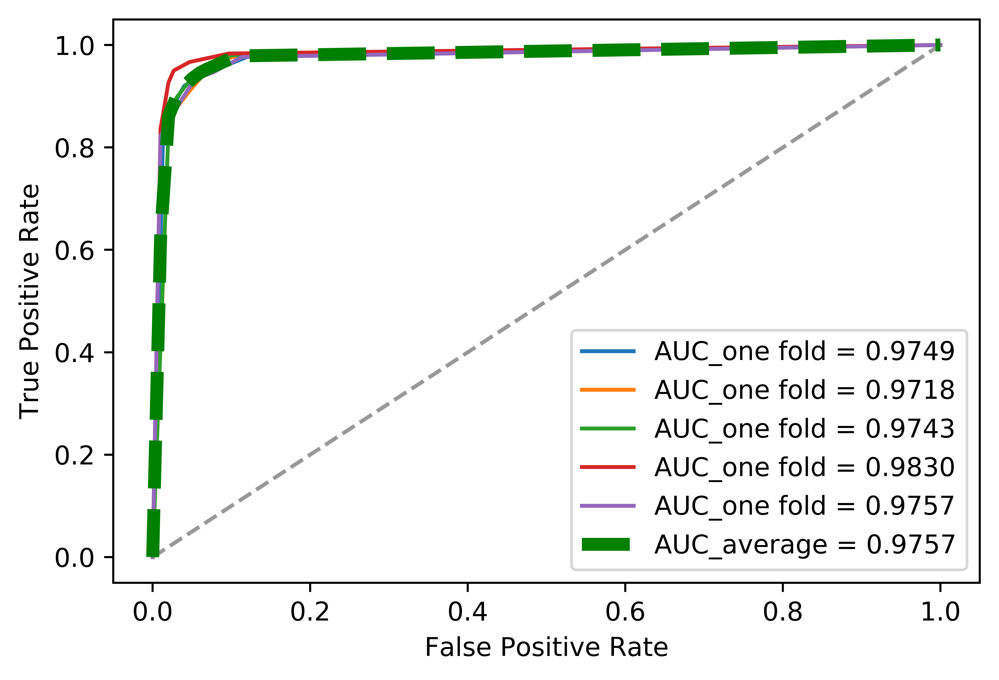

In [21]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Training_set_AAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:int(1 * len(data)), :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y



if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)


# 画平均ROC曲线的两个参数
model = KNeighborsClassifier(n_neighbors=5)

smo = SMOTE(random_state=42)
cv = StratifiedKFold(n_splits=5)  # 导入该模型，后面将数据划分5份

mean_tpr = 0.0  # 用来记录画平均ROC曲线的信息
mean_fpr = np.linspace(0, 1, 100)
cnt = 0
for i, (train, test) in enumerate(cv.split(x, y)):  # 利用模型划分数据集和目标变量 为一一对应的下标
    cnt += 1

    x_train, y_train = smo.fit_resample(x[train], y[train])
    print(Counter(y_train))
    probas_ = model.fit(x_train, y_train).predict_proba(x[test])  # 训练模型后预测每条样本得到两种结果的概率
    #print(probas_)
    y_pred = model.predict(x[test])
    #print(y_pred)
    fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个
    mean_tpr += np.interp(mean_fpr, fpr, tpr)  # 插值函数 interp(x坐标,每次x增加距离,y坐标)  累计每次循环的总值后面求平均值
    mean_tpr[0] = 0.0  # 将第一个真正例=0 以0为起点
    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr, label='AUC_one fold = {0:.4f}'.format(roc_auc), lw=1.5)  # 画出当前分割数据的ROC曲线

    accuracy = accuracy_score(y[test], y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y[test], y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y[test], y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y[test], y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, 'g--', label='AUC_average = {0:.4f}'.format(mean_auc), lw=5)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('Knn算法Training_set的AAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### Knn算法Test_set的AAC特征ROC曲线

accuracy: 90.00%
recall: 86.27%
prec: 93.62%
f1: 89.80%


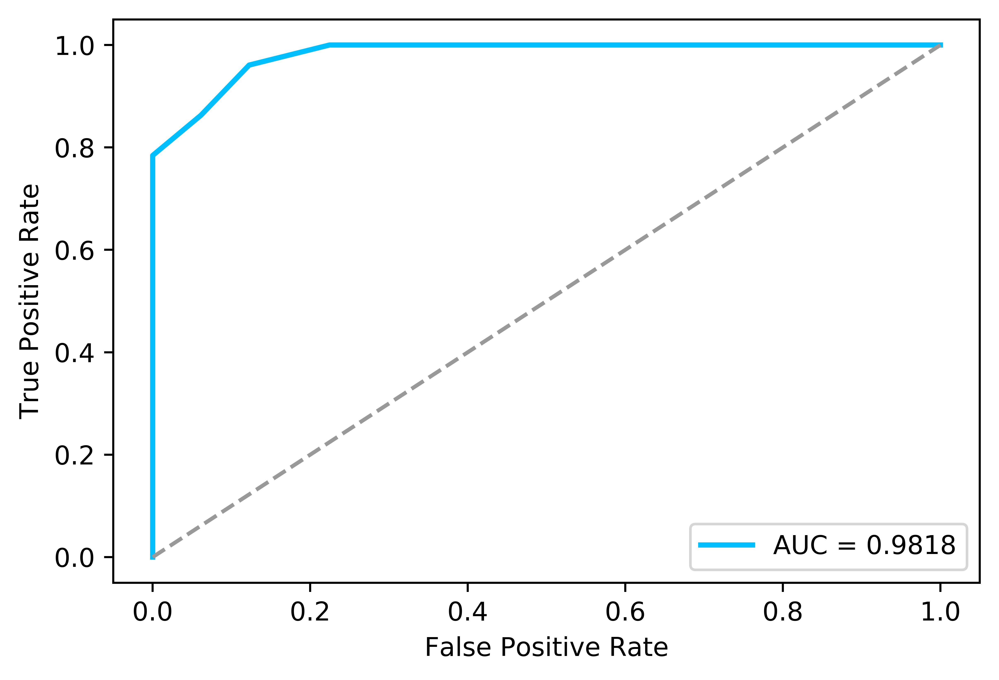

In [57]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Test_set_AAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:, :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y

if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
    
    
    model = KNeighborsClassifier(n_neighbors=5)
    smo = SMOTE(random_state=42)
    x_train_res, y_train_res = smo.fit_resample(x_train, y_train)

    probas_ = model.fit(x_train_res, y_train_res).predict_proba(x_test)  # 训练模型后预测每条样本得到两种结果的概率

    y_pred = model.predict(x_test)

    fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个

    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr,  color='deepskyblue',label='AUC = {0:.4f}'.format(roc_auc), lw=2)  # 画出ROC曲线

    accuracy = accuracy_score(y_test, y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y_test, y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y_test, y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y_test, y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('Knn算法Test_set的AAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### Knn算法Training_set的PseAAC特征ROC曲线

Counter({1: 1200, 0: 1200})
accuracy: 87.33%
recall: 94.33%
prec: 82.75%
f1: 88.16%
Counter({1: 1200, 0: 1200})
accuracy: 88.17%
recall: 93.33%
prec: 84.59%
f1: 88.75%
Counter({1: 1200, 0: 1200})
accuracy: 87.83%
recall: 93.33%
prec: 84.08%
f1: 88.47%
Counter({1: 1200, 0: 1200})
accuracy: 88.50%
recall: 94.00%
prec: 84.68%
f1: 89.10%
Counter({1: 1200, 0: 1200})
accuracy: 86.64%
recall: 92.98%
prec: 82.49%
f1: 87.42%


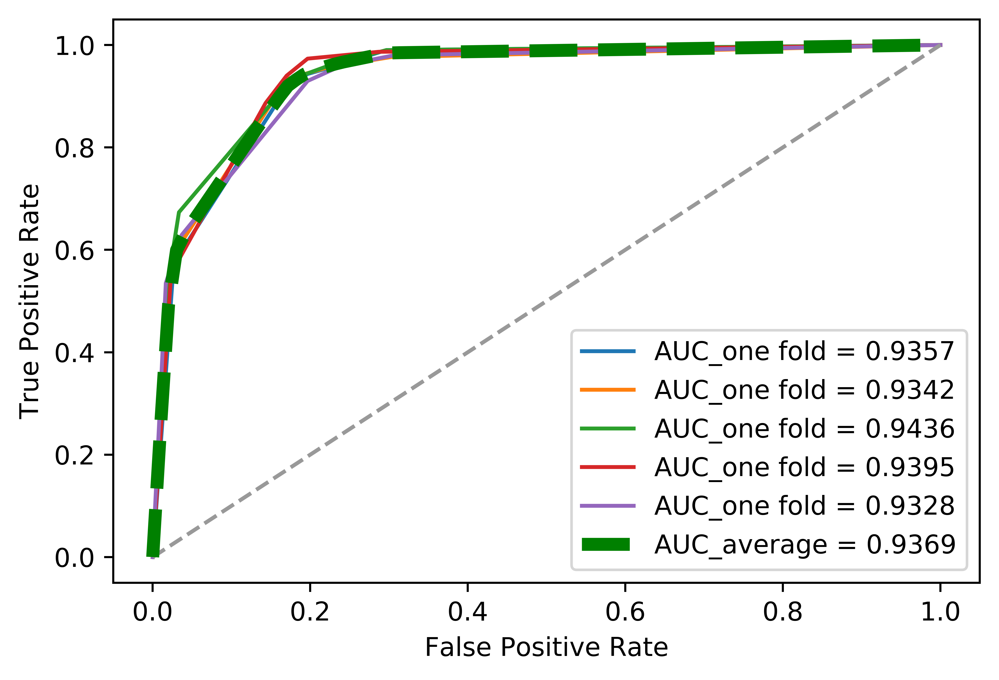

In [4]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Training_set_PseAAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:int(1 * len(data)), :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y



if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)


# 画平均ROC曲线的两个参数
model = KNeighborsClassifier(n_neighbors=5)

smo = SMOTE(random_state=42)
cv = StratifiedKFold(n_splits=5)  # 导入该模型，后面将数据划分5份

mean_tpr = 0.0  # 用来记录画平均ROC曲线的信息
mean_fpr = np.linspace(0, 1, 100)
cnt = 0
for i, (train, test) in enumerate(cv.split(x, y)):  # 利用模型划分数据集和目标变量 为一一对应的下标
    cnt += 1

    x_train, y_train = smo.fit_resample(x[train], y[train])
    print(Counter(y_train))
    probas_ = model.fit(x_train, y_train).predict_proba(x[test])  # 训练模型后预测每条样本得到两种结果的概率
    #print(probas_)
    y_pred = model.predict(x[test])
    #print(y_pred)
    fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个
    mean_tpr += np.interp(mean_fpr, fpr, tpr)  # 插值函数 interp(x坐标,每次x增加距离,y坐标)  累计每次循环的总值后面求平均值
    mean_tpr[0] = 0.0  # 将第一个真正例=0 以0为起点
    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr, label='AUC_one fold = {0:.4f}'.format(roc_auc), lw=1.5)  # 画出当前分割数据的ROC曲线

    accuracy = accuracy_score(y[test], y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y[test], y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y[test], y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y[test], y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, 'g--', label='AUC_average = {0:.4f}'.format(mean_auc), lw=5)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('Knn算法Training_set的PseAAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### Knn算法Test_set的PseAAC特征ROC曲线

accuracy: 80.00%
recall: 86.05%
prec: 72.55%
f1: 78.72%


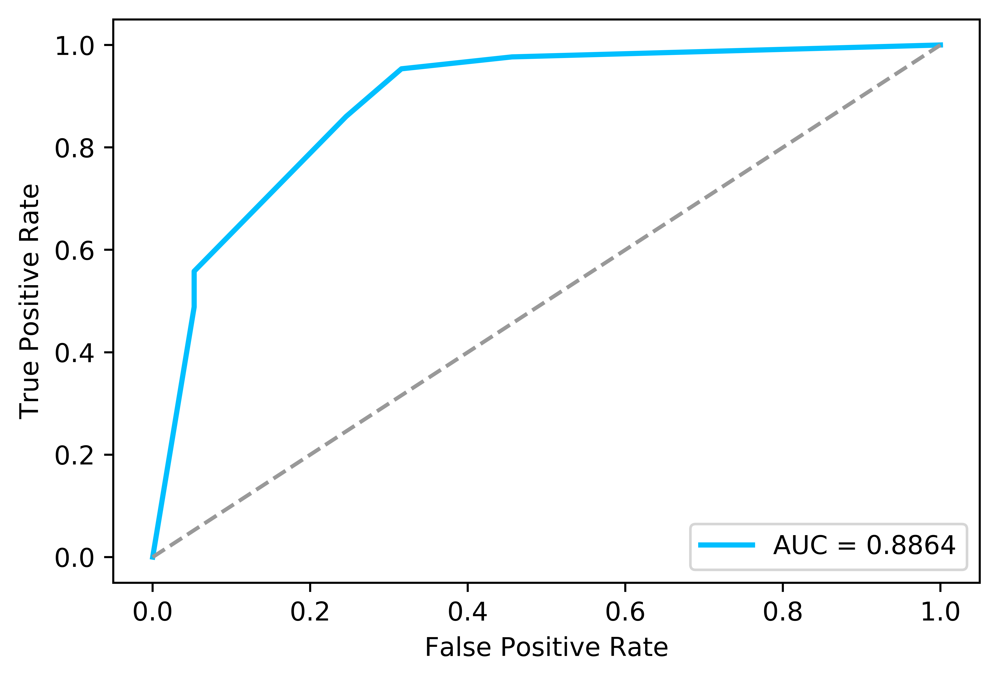

In [60]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Test_set_PseAAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:, :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y

if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
    
    
    model = KNeighborsClassifier(n_neighbors=5)
    smo = SMOTE(random_state=42)
    x_train_res, y_train_res = smo.fit_resample(x_train, y_train)

    probas_ = model.fit(x_train_res, y_train_res).predict_proba(x_test)  # 训练模型后预测每条样本得到两种结果的概率

    y_pred = model.predict(x_test)

    fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个

    roc_auc = auc(fpr, tpr)  # 求auc面积
    
    plt.plot(fpr, tpr,  color='deepskyblue',label='AUC = {0:.4f}'.format(roc_auc), lw=2)  # 画出ROC曲线

    accuracy = accuracy_score(y_test, y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y_test, y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y_test, y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y_test, y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('Knn算法Test_set的PseAAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

# DT算法

### DT算法Training_set的AAC特征ROC曲线

Counter({0: 1200, 1: 1200})
accuracy: 90.33%
recall: 90.00%
prec: 90.60%
f1: 90.30%
Counter({0: 1200, 1: 1200})
accuracy: 92.33%
recall: 93.67%
prec: 91.23%
f1: 92.43%
Counter({0: 1200, 1: 1200})
accuracy: 92.67%
recall: 93.33%
prec: 92.11%
f1: 92.72%
Counter({0: 1200, 1: 1200})
accuracy: 91.67%
recall: 91.33%
prec: 91.95%
f1: 91.64%
Counter({0: 1200, 1: 1200})
accuracy: 91.65%
recall: 93.65%
prec: 90.03%
f1: 91.80%


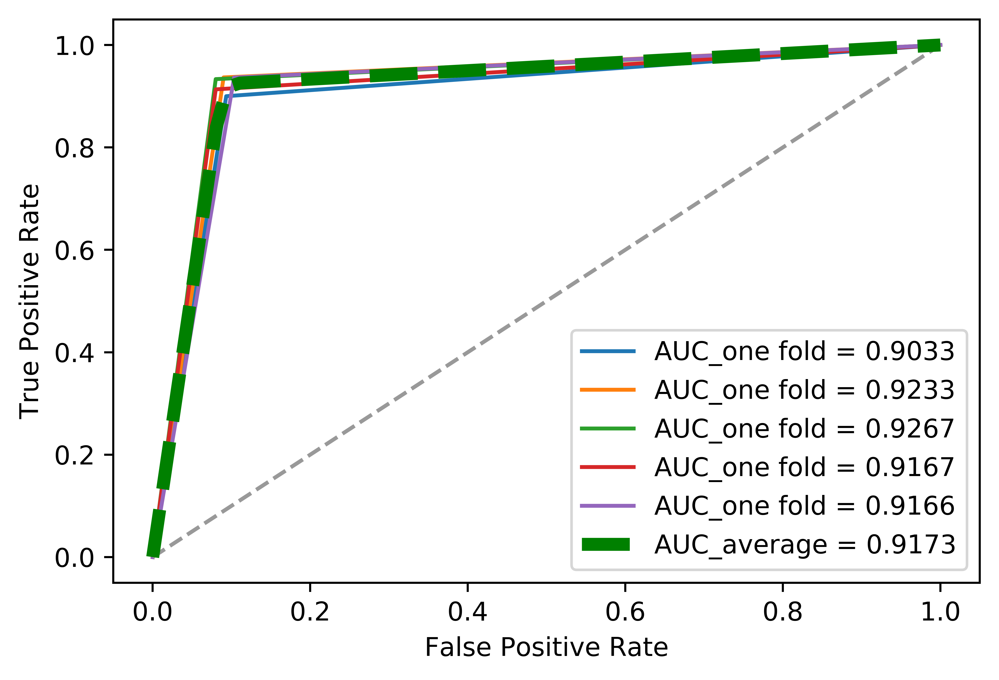

In [25]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.tree import DecisionTreeClassifier
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Training_set_AAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:int(1 * len(data)), :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y



if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)


# 画平均ROC曲线的两个参数
model = DecisionTreeClassifier()

smo = SMOTE(random_state=42)
cv = StratifiedKFold(n_splits=5)  # 导入该模型，后面将数据划分5份

mean_tpr = 0.0  # 用来记录画平均ROC曲线的信息
mean_fpr = np.linspace(0, 1, 100)
cnt = 0
for i, (train, test) in enumerate(cv.split(x, y)):  # 利用模型划分数据集和目标变量 为一一对应的下标
    cnt += 1

    x_train, y_train = smo.fit_resample(x[train], y[train])
    print(Counter(y_train))
    probas_ = model.fit(x_train, y_train).predict_proba(x[test])  # 训练模型后预测每条样本得到两种结果的概率
    #print(probas_)
    y_pred = model.predict(x[test])
    #print(y_pred)
    fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个
    mean_tpr += np.interp(mean_fpr, fpr, tpr)  # 插值函数 interp(x坐标,每次x增加距离,y坐标)  累计每次循环的总值后面求平均值
    mean_tpr[0] = 0.0  # 将第一个真正例=0 以0为起点
    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr, label='AUC_one fold = {0:.4f}'.format(roc_auc), lw=1.5)  # 画出当前分割数据的ROC曲线

    accuracy = accuracy_score(y[test], y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y[test], y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y[test], y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y[test], y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, 'g--', label='AUC_average = {0:.4f}'.format(mean_auc), lw=5)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('DT算法Training_set的AAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### DT算法Test_set的AAC特征ROC曲线

accuracy: 88.00%
recall: 93.75%
prec: 83.33%
f1: 88.24%


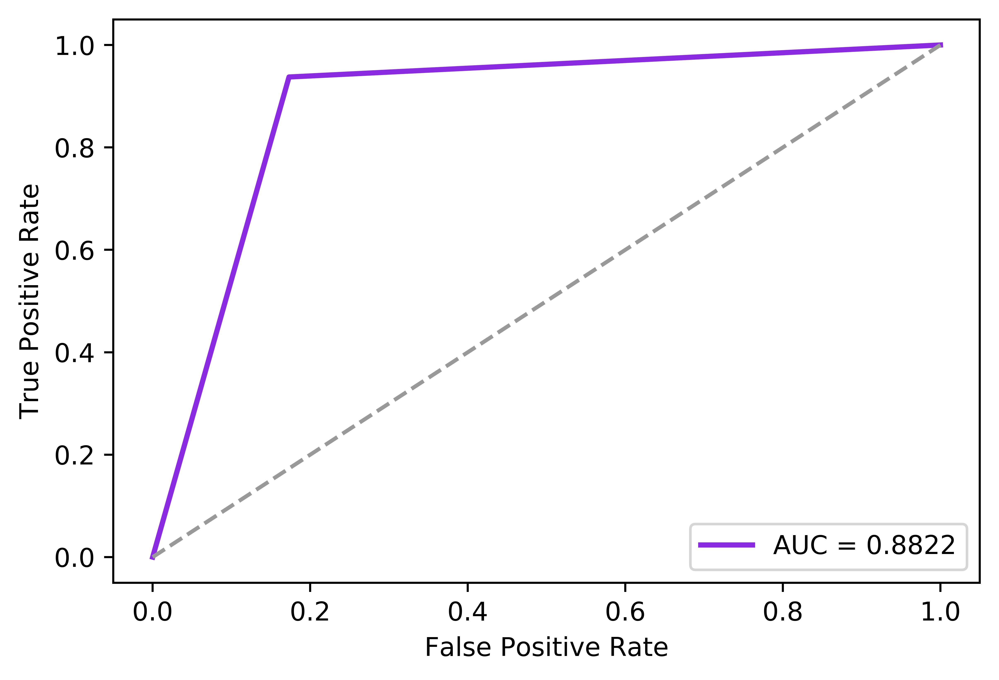

In [65]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.tree import DecisionTreeClassifier
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Test_set_AAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:, :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y

if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
    
    
    model = DecisionTreeClassifier()
    smo = SMOTE(random_state=42)
    x_train_res, y_train_res = smo.fit_resample(x_train, y_train)

    probas_ = model.fit(x_train_res, y_train_res).predict_proba(x_test)  # 训练模型后预测每条样本得到两种结果的概率

    y_pred = model.predict(x_test)

    fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个

    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr,  color='blueviolet',label='AUC = {0:.4f}'.format(roc_auc), lw=2)  # 画出ROC曲线

    accuracy = accuracy_score(y_test, y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y_test, y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y_test, y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y_test, y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('DT算法Test_set的AAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### DT算法Training_set的PseAAC特征ROC曲线

Counter({0: 1200, 1: 1200})
accuracy: 86.67%
recall: 91.33%
prec: 83.54%
f1: 87.26%
Counter({0: 1200, 1: 1200})
accuracy: 90.33%
recall: 95.00%
prec: 86.89%
f1: 90.76%
Counter({0: 1200, 1: 1200})
accuracy: 87.33%
recall: 93.33%
prec: 83.33%
f1: 88.05%
Counter({0: 1200, 1: 1200})
accuracy: 85.33%
recall: 92.00%
prec: 81.18%
f1: 86.25%
Counter({0: 1200, 1: 1200})
accuracy: 87.81%
recall: 93.98%
prec: 83.63%
f1: 88.50%


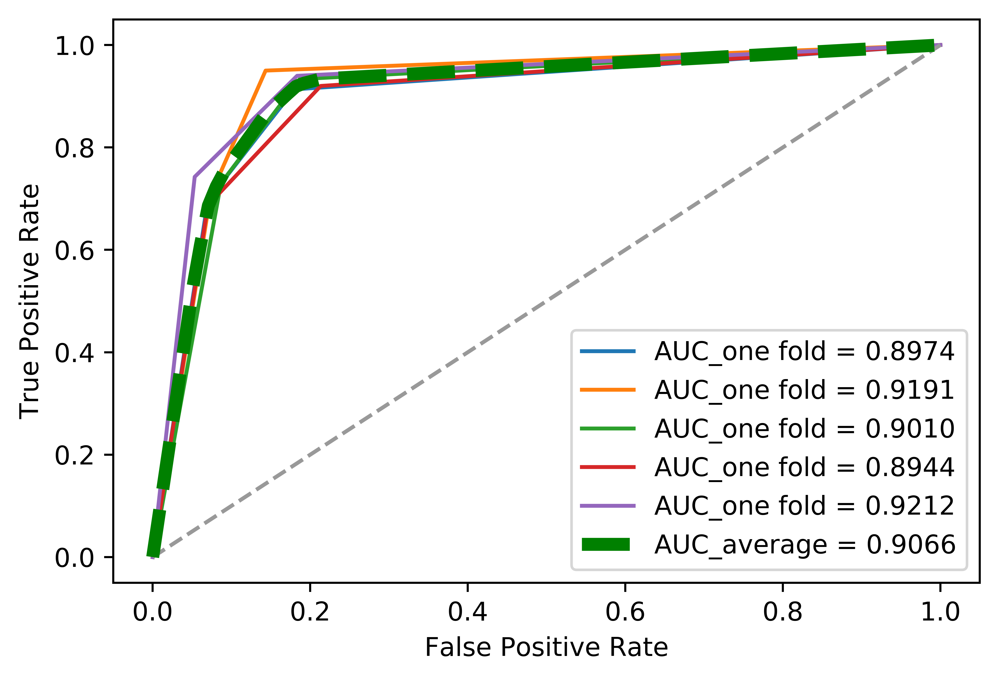

In [29]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.tree import DecisionTreeClassifier
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Training_set_PseAAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:int(1 * len(data)), :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y



if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)


# 画平均ROC曲线的两个参数
model = DecisionTreeClassifier()

smo = SMOTE(random_state=42)
cv = StratifiedKFold(n_splits=5)  # 导入该模型，后面将数据划分5份

mean_tpr = 0.0  # 用来记录画平均ROC曲线的信息
mean_fpr = np.linspace(0, 1, 100)
cnt = 0
for i, (train, test) in enumerate(cv.split(x, y)):  # 利用模型划分数据集和目标变量 为一一对应的下标
    cnt += 1

    x_train, y_train = smo.fit_resample(x[train], y[train])
    print(Counter(y_train))
    probas_ = model.fit(x_train, y_train).predict_proba(x[test])  # 训练模型后预测每条样本得到两种结果的概率
    #print(probas_)
    y_pred = model.predict(x[test])
    #print(y_pred)
    fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个
    mean_tpr += np.interp(mean_fpr, fpr, tpr)  # 插值函数 interp(x坐标,每次x增加距离,y坐标)  累计每次循环的总值后面求平均值
    mean_tpr[0] = 0.0  # 将第一个真正例=0 以0为起点
    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr, label='AUC_one fold = {0:.4f}'.format(roc_auc), lw=1.5)  # 画出当前分割数据的ROC曲线

    accuracy = accuracy_score(y[test], y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y[test], y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y[test], y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y[test], y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, 'g--', label='AUC_average = {0:.4f}'.format(mean_auc), lw=5)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('DT算法Training_set的PseAAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()

### DT算法Test_set的PseAAC特征ROC曲线

accuracy: 79.00%
recall: 85.11%
prec: 74.07%
f1: 79.21%


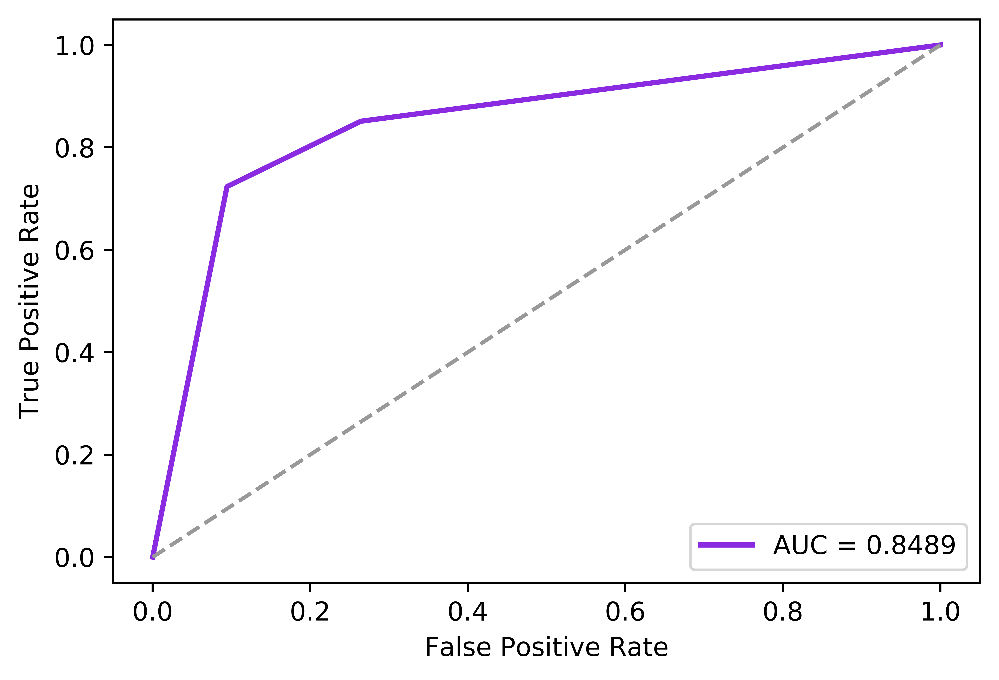

In [68]:
import matplotlib.pyplot as plt
import pandas as pd
from numpy.random import shuffle
from sklearn.tree import DecisionTreeClassifier
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
from collections import Counter

inputfile =  'C:/Users/wang/Desktop/Test_set_PseAAC_features.csv'
labels = ['positive', 'negative']
tick_marks = np.array(range(len(labels))) + 0.5

def readData():

    data = pd.read_csv(inputfile, encoding='utf8')
    data = data.values.astype(np.float32)
    shuffle(data)  # 随机打乱
    data_train = data[:, :]  # 数据集矩阵
    return data_train


def train(data_train):

    x = data_train[:, 0:19] * 30  # 从第二维到最后
    y = data_train[:, 20].astype(int)  # 第一维
    return x, y

if __name__ == '__main__':
    data_train = readData()
    x, y = train(data_train)

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
    
    
    model = DecisionTreeClassifier()
    smo = SMOTE(random_state=42)
    x_train_res, y_train_res = smo.fit_resample(x_train, y_train)

    probas_ = model.fit(x_train_res, y_train_res).predict_proba(x_test)  # 训练模型后预测每条样本得到两种结果的概率

    y_pred = model.predict(x_test)

    fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])  # 该函数得到伪正例、真正例、阈值，这里只使用前两个

    roc_auc = auc(fpr, tpr)  # 求auc面积

    plt.plot(fpr, tpr,  color='blueviolet',label='AUC = {0:.4f}'.format(roc_auc), lw=2)  # 画出ROC曲线

    accuracy = accuracy_score(y_test, y_pred)
    print("accuracy: %.2f%%" % (accuracy * 100.0))

    recall = recall_score(y_test, y_pred)
    print("recall: %.2f%%" % (recall * 100.0))

    prec = precision_score(y_test, y_pred)
    print("prec: %.2f%%" % (prec * 100.0))

    f1 = f1_score(y_test, y_pred)
    print("f1: %.2f%%" % (f1 * 100.0))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6)) # 画对角线

mean_tpr /= cnt # 求数组的平均值
mean_tpr[-1] = 1.0 # 坐标最后一个点为（1,1） 以1为终点
mean_auc = auc(mean_fpr, mean_tpr)

plt.xlim([-0.05, 1.05]) # 设置x、y轴的上下限，设置宽一点，以免和边缘重合，可以更好的观察图像的整体
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') # 可以使用中文，但需要导入一些库即字体
#plt.title('model')
plt.legend(loc="lower right")
plt.savefig('DT算法Test_set的PseAAC特征ROC曲线.jpg')
plt.rcParams['figure.dpi'] = 900 # 设置全局dpi值为900，根据需要进行调整
plt.show()